<a href="https://colab.research.google.com/github/Madhuvarma8008/AIML-2025/blob/main/KNN_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [6]:
df = pd.read_csv('/content/drive/MyDrive/aiml/Classified_Data.txt',index_col=0)
df.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
0,0.913917,1.162073,0.567946,0.755464,0.780862,0.352608,0.759697,0.643798,0.879422,1.231409,1
1,0.635632,1.003722,0.535342,0.825645,0.924109,0.648450,0.675334,1.013546,0.621552,1.492702,0
2,0.721360,1.201493,0.921990,0.855595,1.526629,0.720781,1.626351,1.154483,0.957877,1.285597,0
3,1.234204,1.386726,0.653046,0.825624,1.142504,0.875128,1.409708,1.380003,1.522692,1.153093,1
4,1.279491,0.949750,0.627280,0.668976,1.232537,0.703727,1.115596,0.646691,1.463812,1.419167,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   WTT           1000 non-null   float64
 1   PTI           1000 non-null   float64
 2   EQW           1000 non-null   float64
 3   SBI           1000 non-null   float64
 4   LQE           1000 non-null   float64
 5   QWG           1000 non-null   float64
 6   FDJ           1000 non-null   float64
 7   PJF           1000 non-null   float64
 8   HQE           1000 non-null   float64
 9   NXJ           1000 non-null   float64
 10  TARGET CLASS  1000 non-null   int64  
dtypes: float64(10), int64(1)
memory usage: 93.8 KB


In [8]:
df.describe()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,0.949682,1.114303,0.834127,0.682099,1.032336,0.943534,0.963422,1.071960,1.158251,1.362725,0.50000
std,0.289635,0.257085,0.291554,0.229645,0.243413,0.256121,0.255118,0.288982,0.293738,0.204225,0.50025
min,0.174412,0.441398,0.170924,0.045027,0.315307,0.262389,0.295228,0.299476,0.365157,0.639693,0.00000
25%,0.742358,0.942071,0.615451,0.515010,0.870855,0.761064,0.784407,0.866306,0.934340,1.222623,0.00000
50%,0.940475,1.118486,0.813264,0.676835,1.035824,0.941502,0.945333,1.065500,1.165556,1.375368,0.50000
75%,1.163295,1.307904,1.028340,0.834317,1.198270,1.123060,1.134852,1.283156,1.383173,1.504832,1.00000
max,1.721779,1.833757,1.722725,1.634884,1.650050,1.666902,1.713342,1.785420,1.885690,1.893950,1.00000


In [ ]:
df.isna().sum()

,0
WTT,0
PTI,0
EQW,0
SBI,0
LQE,0
QWG,0
FDJ,0
PJF,0
HQE,0
NXJ,0


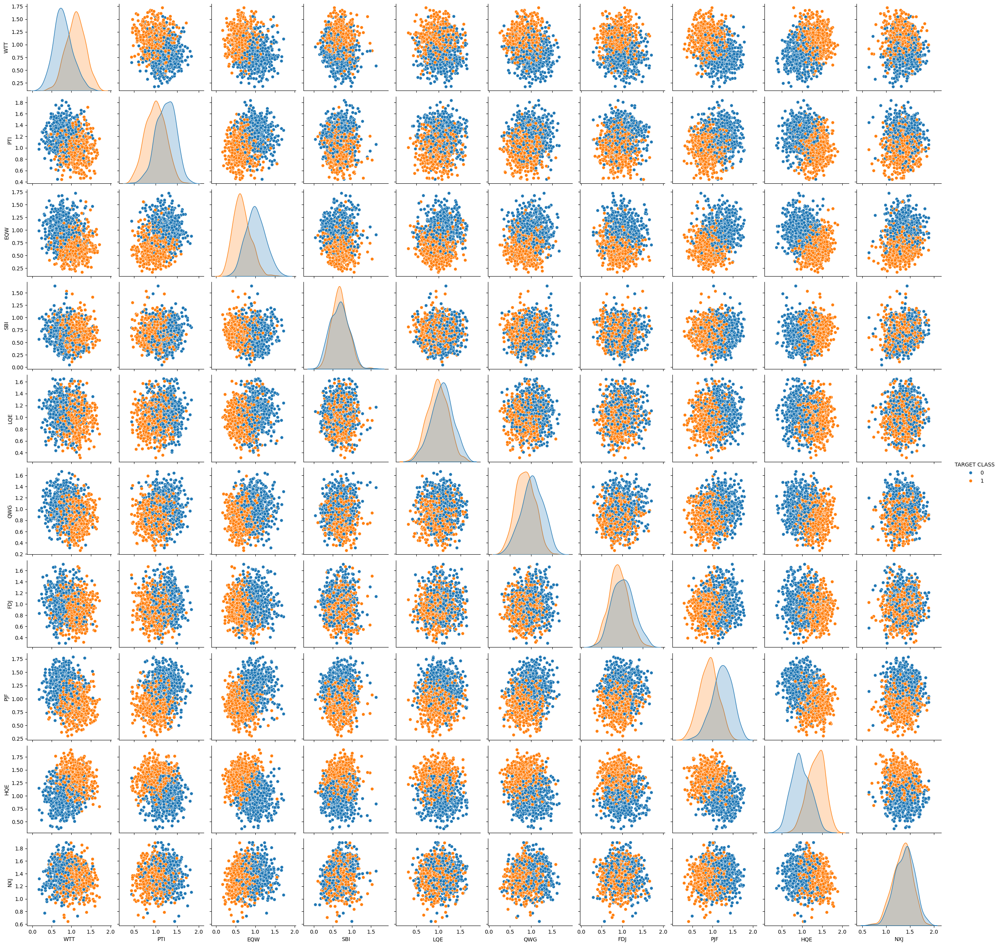

In [ ]:
sns.pairplot(df, hue='TARGET CLASS',kind="scatter")


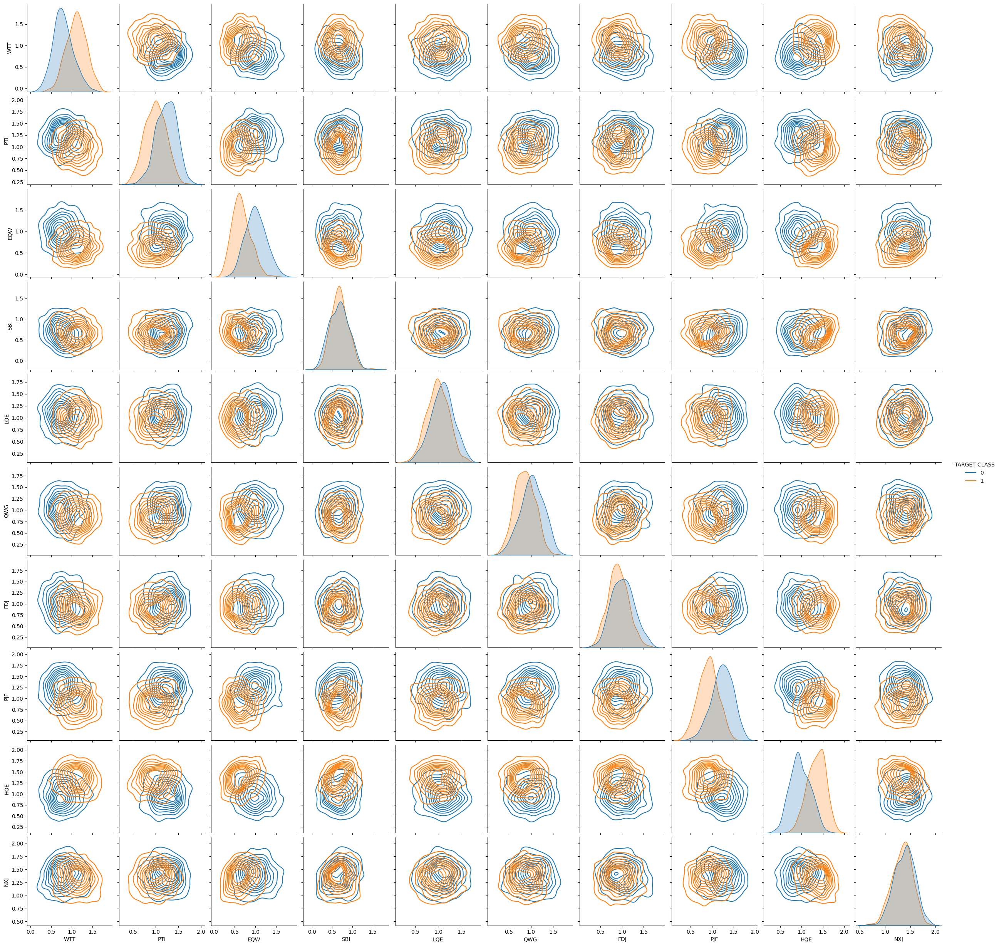

In [ ]:
sns.pairplot(df, hue='TARGET CLASS', kind ="kde")

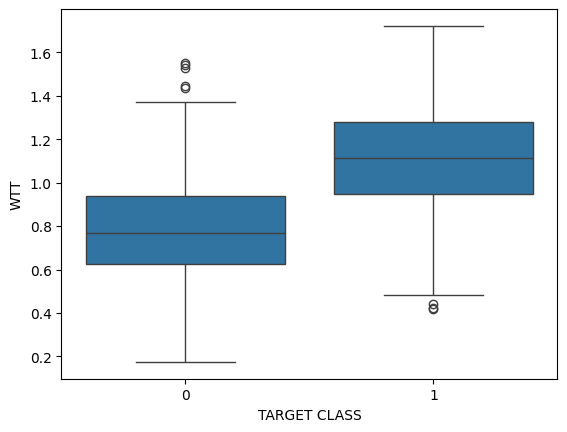

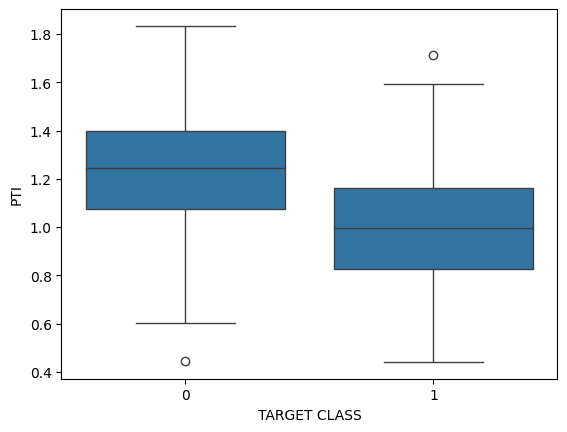

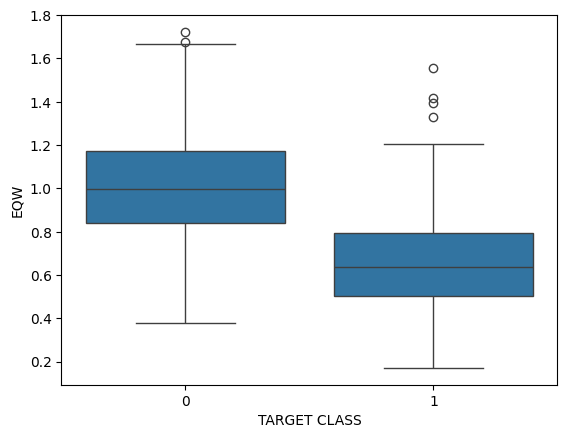

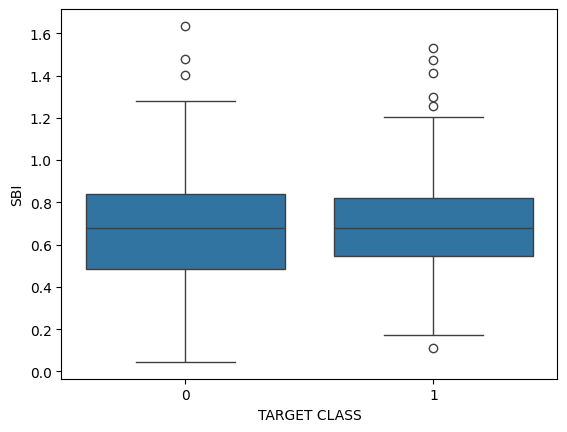

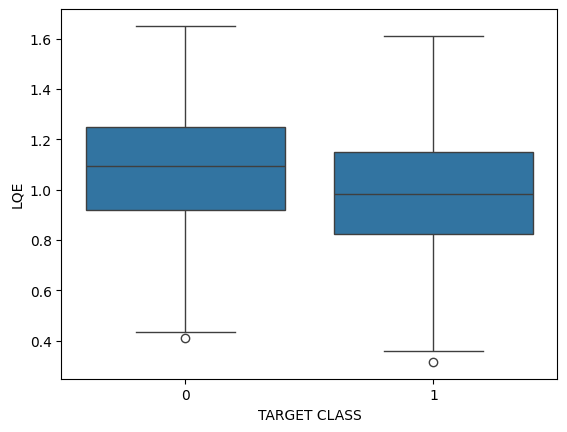

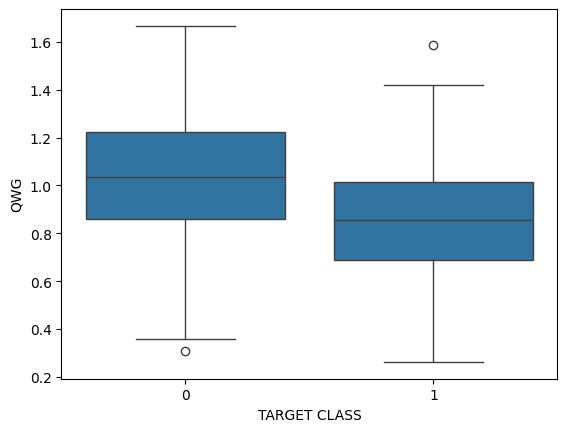

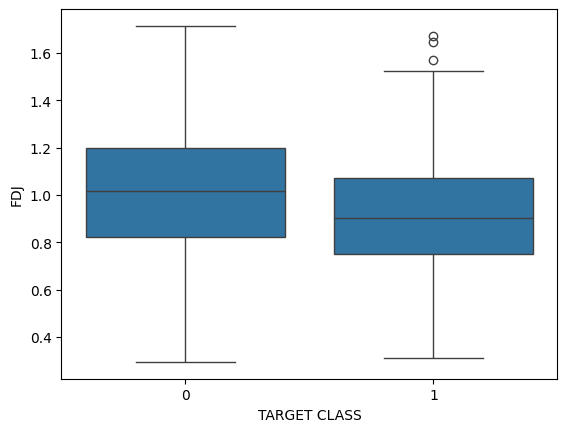

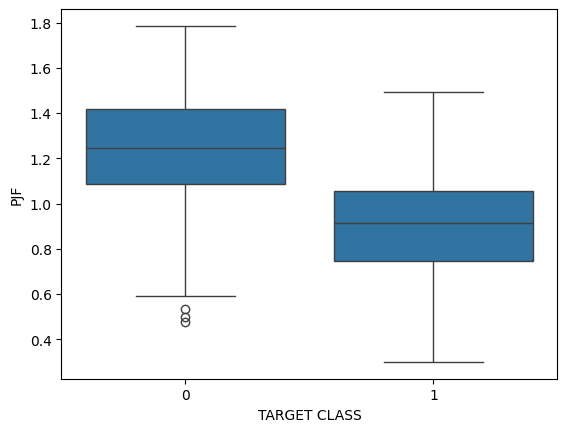

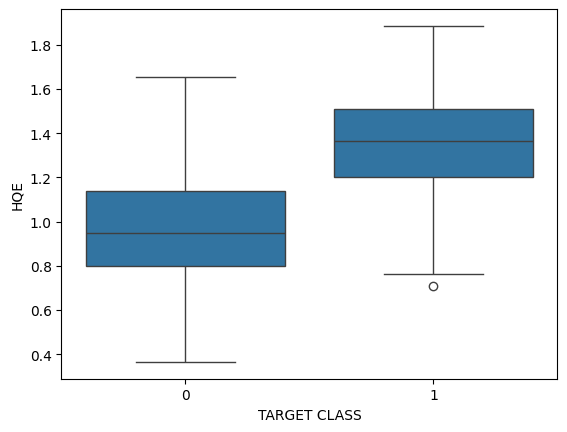

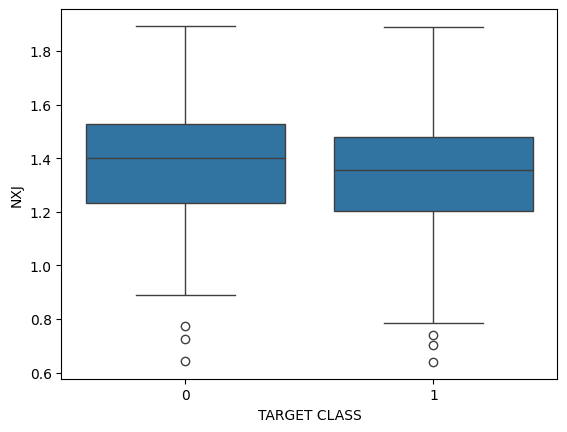

<Figure size 640x480 with 0 Axes>

In [ ]:
l = df.columns
for i in range(len(l)-1):
  sns.boxplot(x='TARGET CLASS',y=l[i],data=df)
  plt.figure()


In [9]:
from sklearn.preprocessing import StandardScaler

from google.colab import drive
drive.mount('/content/drive')

In [10]:
sc = StandardScaler()

In [11]:
scaled_features = sc.fit_transform(df.drop('TARGET CLASS',axis=1))
scaled_features

array([[-0.12354188,  0.18590747, -0.91343069, ..., -1.48236813,
        -0.9497194 , -0.64331425],
       [-1.08483602, -0.43034845, -1.02531333, ..., -0.20224031,
        -1.82805088,  0.63675862],
       [-0.78870217,  0.33931821,  0.30151137, ...,  0.28570652,
        -0.68249379, -0.37784986],
       ...,
       [ 0.64177714, -0.51308341, -0.17920486, ..., -2.36249443,
        -0.81426092,  0.11159651],
       [ 0.46707241, -0.98278576, -1.46519359, ..., -0.03677699,
         0.40602453, -0.85567   ],
       [-0.38765353, -0.59589427, -1.4313981 , ..., -0.56778932,
         0.3369971 ,  0.01034996]])

In [12]:
df_scaled = pd.DataFrame(scaled_features,columns=df.columns[:-1])
df_scaled.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ
0,-0.123542,0.185907,-0.913431,0.319629,-1.033637,-2.308375,-0.798951,-1.482368,-0.949719,-0.643314
1,-1.084836,-0.430348,-1.025313,0.625388,-0.444847,-1.152706,-1.129797,-0.202240,-1.828051,0.636759
2,-0.788702,0.339318,0.301511,0.755873,2.031693,-0.870156,2.599818,0.285707,-0.682494,-0.377850
3,0.982841,1.060193,-0.621399,0.625299,0.452820,-0.267220,1.750208,1.066491,1.241325,-1.026987
4,1.139275,-0.640392,-0.709819,-0.057175,0.822886,-0.936773,0.596782,-1.472352,1.040772,0.276510


<Axes: >

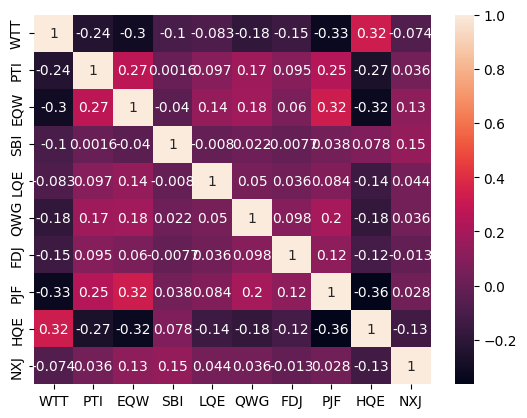

In [14]:
sns.heatmap(df_scaled.corr(), annot=True)

In [15]:
from sklearn.model_selection import train_test_split

In [16]:
x = df_scaled
y = df['TARGET CLASS']
x_train,x_test,y_train,y_test = train_test_split(scaled_features,df['TARGET CLASS'],test_size=0.20,random_state=10)


In [17]:
from sklearn.neighbors import KNeighborsClassifier

In [18]:
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=2)

In [33]:
y_train_pred = knn.predict(x_train)
y_test_pred = knn.predict(x_test)

In [27]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [34]:
print("Training Accuracy = ",accuracy_score(y_train,y_train_pred))
print("Testing Accuracy = ",accuracy_score(y_test,y_test_pred))

Training Accuracy =  0.96125
Testing Accuracy =  0.93


In [35]:
cm=confusion_matrix(y_test,y_test_pred)
cm

array([[107,   5],
       [  9,  79]])

<Axes: >

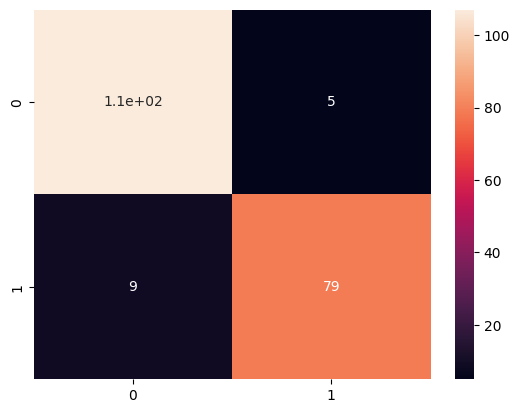

In [36]:
sns.heatmap(cm,annot = True)

In [37]:
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94       112
           1       0.94      0.90      0.92        88

    accuracy                           0.93       200
   macro avg       0.93      0.93      0.93       200
weighted avg       0.93      0.93      0.93       200



In [39]:
print("misclassification error rate:",np.mean(y_test_pred!=y_test))

misclassification error rate: 0.07


In [40]:
n=60

In [41]:
error_rate = []
for i in range(1,n):
  knn = KNeighborsClassifier(n_neighbors=i)
  knn.fit(x_train,y_train)
  pred_i = knn.predict(x_test)
  error_rate.append(np.mean(pred_i !=y_test))

Text(0, 0.5, 'Error (misclassification) Rate')

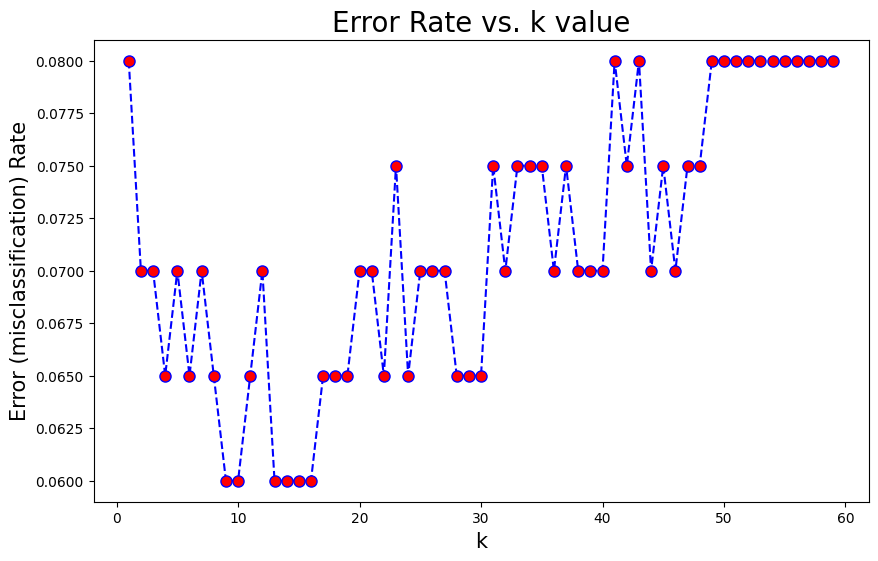

In [45]:
plt.figure(figsize=(10,6))
plt.plot(range(1,n),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red' , markersize=8)
plt.title('Error Rate vs. k value',fontsize=20)
plt.xlabel('k',fontsize=15)
plt.ylabel('Error (misclassification) Rate',fontsize=15)

In [47]:
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=9)

In [48]:
print("Training Accurracy = ",accuracy_score(y_train,knn.predict(x_train)))
print("Testing Accurracy = ",accuracy_score(y_test,knn.predict(x_test)))

Training Accurracy =  0.935
Testing Accurracy =  0.94
